In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# EDA

## Nuclide Data

In [4]:
data = pd.read_csv("/content/drive/Shareddrives/Data240_Project/Datasets/MARIS/global_since_1999.zip (Unzipped Files)/ExportSample.csv")

data.head()

<ipython-input-4-012c6d110d91>:1: DtypeWarning: Columns (6,12,18,35,36,41,42,44,48) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("/content/drive/Shareddrives/Data240_Project/Datasets/MARIS/global_since_1999.zip (Unzipped Files)/ExportSample.csv")


,MARIS sample ID,Sample type,Laboratory,Latitude (decimal),Longitude (decimal),Station ID,Data provider's sample ID,MARIS Profile ID,MARIS Transect ID,Sampling depth (m),...,Counting method,MARIS reference ID,Reference/Citation,Zotero URL,Reference note,Sample note,Measurement note,Activity Corrected,Uncertanity Corrected,Unit Corrected
0,418316,Seawater,NOT AVAILABLE,87.497222,179.841111,101 (PS94),NaN,122.55,NaN,2.0,...,Accelerator mass spectrometry,122,"Casacuberta, N., Christl, M., Vockenhuber, C.,...",https://www.zotero.org/groups/2432820/maris/it...,NaN,PS94 cruise,NaN,NaN,NaN,NaN
1,418316,Seawater,NOT AVAILABLE,87.497222,179.841111,101 (PS94),NaN,122.56,NaN,2.0,...,Accelerator mass spectrometry,122,"Casacuberta, N., Christl, M., Vockenhuber, C.,...",https://www.zotero.org/groups/2432820/maris/it...,NaN,PS94 cruise,NaN,NaN,NaN,NaN
2,418316,Seawater,NOT AVAILABLE,87.497222,179.841111,101 (PS94),NaN,122.57,NaN,2.0,...,Accelerator mass spectrometry,122,"Casacuberta, N., Christl, M., Vockenhuber, C.,...",https://www.zotero.org/groups/2432820/maris/it...,NaN,PS94 cruise,NaN,NaN,NaN,NaN
3,418299,Seawater,NOT AVAILABLE,85.085556,139.978611,125 (PS94),NaN,122.49,NaN,100.0,...,Accelerator mass spectrometry,122,"Casacuberta, N., Christl, M., Vockenhuber, C.,...",https://www.zotero.org/groups/2432820/maris/it...,NaN,PS94 cruise,NaN,NaN,NaN,NaN
4,418299,Seawater,NOT AVAILABLE,85.085556,139.978611,125 (PS94),NaN,122.50,NaN,100.0,...,Accelerator mass spectrometry,122,"Casacuberta, N., Christl, M., Vockenhuber, C.,...",https://www.zotero.org/groups/2432820/maris/it...,NaN,PS94 cruise,NaN,NaN,NaN,NaN


In [5]:
len(data)

273092

In [6]:
column_names = data.columns.tolist()
print("\nColumn Names:")
print(column_names)


Column Names:
['MARIS sample ID', 'Sample type', 'Laboratory', 'Latitude (decimal)', 'Longitude (decimal)', 'Station ID', "Data provider's sample ID", 'MARIS Profile ID', 'MARIS Transect ID', 'Sampling depth (m)', 'Total depth (m)', 'Sampling start datetime', 'Sampling end datetime', 'Nuclide', 'Value type', 'Activity or MDA', 'Uncertainty', 'Unit', 'Variable type', 'Number of data points', 'Minimum value', 'Maximum value', 'Taxon name', 'Reported taxon name', 'Taxon rank', 'Biogroup', 'Taxon database URL', 'Body part', 'Top of core interval (cm)', 'Bottom of core interval (cm)', 'Sediment type', 'Reported sediment type', 'Sample volume (L)', 'Salinity', 'Temperature [°C]', 'Filtered', 'Mesh size (µm)', 'Sample surface area (cm2)', 'Dry weight (g)', 'Wet weight (g)', 'Dry/Wet (%)', 'Sampling method', 'Preparation method', 'Drying method', 'Counting method', 'MARIS reference ID', 'Reference/Citation', 'Zotero URL', 'Reference note', 'Sample note', 'Measurement note', 'Activity Correcte

In [7]:
# Basic information about the data columns, data types, and null values
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 273092 entries, 0 to 273091
Data columns (total 54 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   MARIS sample ID               273092 non-null  int64  
 1   Sample type                   273092 non-null  object 
 2   Laboratory                    273092 non-null  object 
 3   Latitude (decimal)            273092 non-null  float64
 4   Longitude (decimal)           273092 non-null  float64
 5   Station ID                    272410 non-null  object 
 6   Data provider's sample ID     80063 non-null   object 
 7   MARIS Profile ID              77880 non-null   float64
 8   MARIS Transect ID             0 non-null       float64
 9   Sampling depth (m)            273092 non-null  float64
 10  Total depth (m)               203090 non-null  float64
 11  Sampling start datetime       273092 non-null  object 
 12  Sampling end datetime         730 non-null  

In [8]:
# Descriptive statistics for numeric columns
data.describe()

,MARIS sample ID,Latitude (decimal),Longitude (decimal),MARIS Profile ID,MARIS Transect ID,Sampling depth (m),Total depth (m),Activity or MDA,Uncertainty,Number of data points,...,Temperature [°C],Sample surface area (cm2),Dry weight (g),Wet weight (g),Dry/Wet (%),Drying method,MARIS reference ID,Activity Corrected,Uncertanity Corrected,Unit Corrected
count,273092.000000,273092.000000,273092.000000,77880.000000,0.0,273092.000000,203090.000000,2.635070e+05,9.696400e+04,48.000000,...,13888.000000,0.0,0.0,0.0,0.0,0.0,273092.000000,0.0,0.0,0.0
mean,465340.017181,38.205347,96.187104,310.643511,NaN,114.998206,510.324074,5.250326e+06,4.104617e+05,5.375000,...,9.426145,NaN,NaN,NaN,NaN,NaN,245.966330,NaN,NaN,NaN
std,94121.454872,15.017010,75.140925,204.380964,NaN,485.121497,1330.974584,3.974069e+08,2.371671e+07,9.907283,...,9.374688,NaN,NaN,NaN,NaN,NaN,185.927408,NaN,NaN,NaN
min,19229.000000,-75.750556,-179.808611,52.134009,NaN,-1.000000,-999.000000,-9.999000e+03,-9.990000e+02,1.000000,...,-1.815300,NaN,NaN,NaN,NaN,NaN,56.000000,NaN,NaN,NaN
25%,425433.750000,37.322222,11.750833,121.746230,NaN,2.000000,10.000000,2.900000e+00,6.900000e-02,3.000000,...,2.700000,NaN,NaN,NaN,NaN,NaN,121.000000,NaN,NaN,NaN
50%,500955.500000,37.423333,141.033889,225.512600,NaN,3.000000,13.200000,4.700000e+02,1.115600e+00,3.000000,...,8.278500,NaN,NaN,NaN,NaN,NaN,126.000000,NaN,NaN,NaN
75%,522694.250000,38.668056,141.047222,402.114400,NaN,16.989667,102.000000,4.000000e+03,4.450000e+03,3.500000,...,14.402500,NaN,NaN,NaN,NaN,NaN,395.000000,NaN,NaN,NaN
max,618694.000000,89.990000,179.980000,705.444700,NaN,6128.500000,8025.000000,1.580000e+11,4.333333e+09,69.000000,...,99.990000,NaN,NaN,NaN,NaN,NaN,705.000000,NaN,NaN,NaN


In [9]:
cleaned_data = data.dropna(axis=1, how='all')
# Remove collumns with 0 non-null values

In [10]:
cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 273092 entries, 0 to 273091
Data columns (total 35 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   MARIS sample ID            273092 non-null  int64  
 1   Sample type                273092 non-null  object 
 2   Laboratory                 273092 non-null  object 
 3   Latitude (decimal)         273092 non-null  float64
 4   Longitude (decimal)        273092 non-null  float64
 5   Station ID                 272410 non-null  object 
 6   Data provider's sample ID  80063 non-null   object 
 7   MARIS Profile ID           77880 non-null   float64
 8   Sampling depth (m)         273092 non-null  float64
 9   Total depth (m)            203090 non-null  float64
 10  Sampling start datetime    273092 non-null  object 
 11  Sampling end datetime      730 non-null     object 
 12  Nuclide                    273092 non-null  object 
 13  Value type                 27

In [11]:
# Remove columns that are less than 50% of the total data point
threshold = 0.5 * len(cleaned_data)
cleaned_data = cleaned_data.dropna(thresh=threshold, axis=1)
cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 273092 entries, 0 to 273091
Data columns (total 17 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   MARIS sample ID          273092 non-null  int64  
 1   Sample type              273092 non-null  object 
 2   Laboratory               273092 non-null  object 
 3   Latitude (decimal)       273092 non-null  float64
 4   Longitude (decimal)      273092 non-null  float64
 5   Station ID               272410 non-null  object 
 6   Sampling depth (m)       273092 non-null  float64
 7   Total depth (m)          203090 non-null  float64
 8   Sampling start datetime  273092 non-null  object 
 9   Nuclide                  273092 non-null  object 
 10  Value type               273092 non-null  object 
 11  Activity or MDA          263507 non-null  float64
 12  Unit                     273092 non-null  object 
 13  MARIS reference ID       273092 non-null  int64  
 14  Refe

In [12]:
# Select some of the useful columns
columns_list = ['Sample type','Latitude (decimal)', 'Longitude (decimal)','Sampling depth (m)','Sampling start datetime','Nuclide','Value type','Activity or MDA']
cleaned_data = cleaned_data[columns_list]
cleaned_data

,Sample type,Latitude (decimal),Longitude (decimal),Sampling depth (m),Sampling start datetime,Nuclide,Value type,Activity or MDA
0,Seawater,87.497222,179.841111,2.0,9/14/2015 12:00:00 AM,129I,=,1.390000e+09
1,Seawater,87.497222,179.841111,2.0,9/14/2015 12:00:00 AM,236U/238U,=,1.606000e-09
2,Seawater,87.497222,179.841111,2.0,9/14/2015 12:00:00 AM,236U,=,1.110000e+07
3,Seawater,85.085556,139.978611,100.0,9/21/2015 12:00:00 AM,129I,=,7.310000e+09
4,Seawater,85.085556,139.978611,100.0,9/21/2015 12:00:00 AM,236U/238U,=,2.309000e-09
...,...,...,...,...,...,...,...,...
273087,Seawater,53.606944,-6.189167,0.0,9/1/2009 12:00:00 AM,137Cs,=,1.322000e+01
273088,Seawater,54.584722,-5.681111,0.0,10/1/2009 12:00:00 AM,99Tc,=,1.300000e-01
273089,Seawater,54.584722,-5.681111,0.0,10/1/2009 12:00:00 AM,137Cs,=,1.720000e+01
273090,Seawater,54.859167,-5.825278,0.0,10/1/2009 12:00:00 AM,99Tc,=,1.910000e+00


In [13]:
# Check the number of Value types that tell us the detection of Nuclide is above MDA
unique_value_counts = cleaned_data['Value type'].value_counts()
print(unique_value_counts)

=     169308
<      94199
ND      9585
Name: Value type, dtype: int64


In [14]:
# Drop a row that 'Value type'] != 'ND' & < which mean that there is No detection. and the detection is below the MDA
cleaned_data = cleaned_data[cleaned_data['Value type'] != 'ND']
cleaned_data = cleaned_data[cleaned_data['Value type'] != '<']

In [15]:
## Split the year
cleaned_data['Year'] = cleaned_data['Sampling start datetime'].str.split(' ').str[0].str.split('/').str[2]

In [16]:
cleaned_data.head()

,Sample type,Latitude (decimal),Longitude (decimal),Sampling depth (m),Sampling start datetime,Nuclide,Value type,Activity or MDA,Year
0,Seawater,87.497222,179.841111,2.0,9/14/2015 12:00:00 AM,129I,=,1.390000e+09,2015
1,Seawater,87.497222,179.841111,2.0,9/14/2015 12:00:00 AM,236U/238U,=,1.606000e-09,2015
2,Seawater,87.497222,179.841111,2.0,9/14/2015 12:00:00 AM,236U,=,1.110000e+07,2015
3,Seawater,85.085556,139.978611,100.0,9/21/2015 12:00:00 AM,129I,=,7.310000e+09,2015
4,Seawater,85.085556,139.978611,100.0,9/21/2015 12:00:00 AM,236U/238U,=,2.309000e-09,2015


In [17]:
cleaned_data.describe()

,Latitude (decimal),Longitude (decimal),Sampling depth (m),Activity or MDA
count,169308.000000,169308.000000,169308.000000,1.693080e+05
mean,38.463709,73.467648,170.173826,8.169654e+06
std,18.804529,83.261075,602.923462,4.957608e+08
min,-75.750556,-179.808611,-1.000000,-9.999000e+03
25%,37.333333,-1.958333,2.000000,1.900000e+00
50%,37.431111,140.950000,3.000000,4.000000e+01
75%,49.665278,141.042222,24.000000,4.500000e+03
max,89.990000,179.980000,6128.500000,1.580000e+11


Outliers in Column Latitude (decimal):
87.49722222222222 87.49722222222222 87.49722222222222 85.08555555555554 85.08555555555554 85.08555555555554 84.56027777777777 84.56027777777777 84.56027777777777 84.84416666666667 84.84416666666667 84.84416666666667 85.08555555555554 85.08555555555554 85.08555555555554 87.49722222222222 87.49722222222222 77.36999999999999 77.36999999999999 85.69833333333334 85.69833333333334 85.69833333333334 85.69833333333334 85.69833333333334 85.69833333333334 85.92333333333333 79.34444444444443 88.17888888888889 87.04472222222222 87.04472222222222 82.85972222222222 81.215 84.50222222222222 84.50222222222222 87.04472222222222 80.65583333333333 82.08999999999999 82.08999999999999 82.08999999999999 82.08999999999999 82.08999999999999 82.08999999999999 82.08999999999999 82.08999999999999 85.69833333333334 85.69833333333334 84.655 81.215 84.79583333333333 84.79583333333333 84.79583333333333 79.34444444444443 79.34444444444443 79.34444444444443 87.04472222222222 87.0

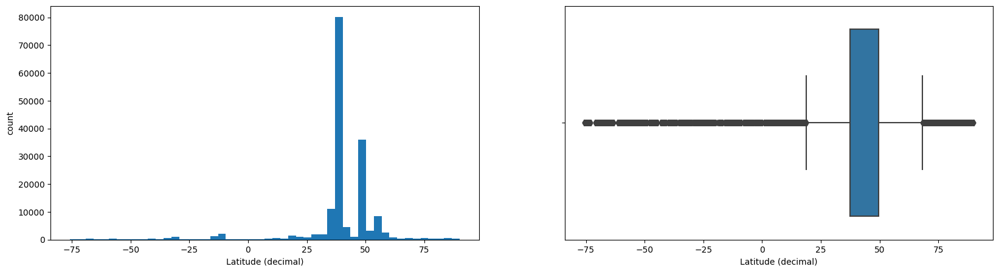

Outliers in Column Longitude (decimal):

Number of Outliers: 0
Lower Bound -216.45916666666668, Upper Bound 355.54305555555555
Skew : -0.77


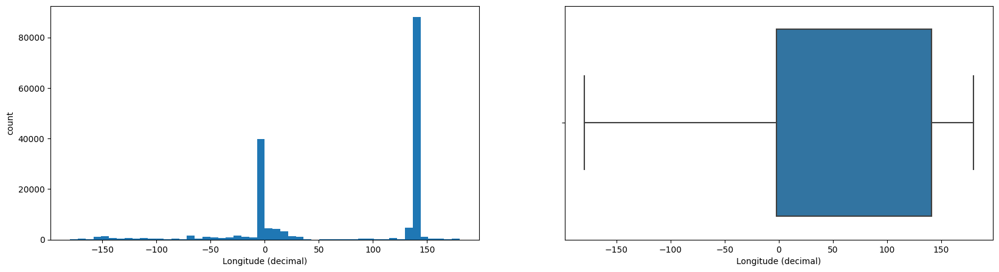

Outliers in Column Sampling depth (m):
100.0 100.0 100.0 4418.0 4418.0 4418.0 500.0 500.0 500.0 1000.0 1000.0 1000.0 999.0 999.0 150.8 150.8 150.6 100.5 2750.3999 2750.3999 200.0 200.0 74.3 149.5 150.4 150.4 150.4 299.5 299.5 199.6 500.4 500.4 500.4 500.4 200.6 194.9 194.9 194.9 74.7 75.5 999.8 999.8 1013.797 204.201 609.778 437.474 1521.265 457.557 390.995 1011.966 1521.941 331.194 809.573 506.958 204.036 1015.081 1520.841 1522.484 406.975 386.318 810.163 269.693 317.739 609.733 3055.566 217.281 610.375 227.167 605.334 3054.788 810.139 335.066 1522.163 328.448 507.153 191.735 508.372 608.857 608.678 507.745 310.157 66.71 808.967 204.183 1015.615 370.471 507.947 407.841 1015.294 2032.498 165.304 204.033 203.905 1016.009 379.953 407.245 212.3 124.5 244.2 240.8 3728.0 1420.0 1420.0 1420.0 1418.0 1418.0 1418.0 2134.0 2134.0 2134.0 121.0 121.0 1776.0 1776.0 1776.0 606.0 606.0 606.0 74.0 74.0 74.0 248.0 1674.8 912.9 85.8 3738.7 177.3 1013.7 810.0 1777.6 1317.3 759.4 2951.1 809.8 505.9 1012.

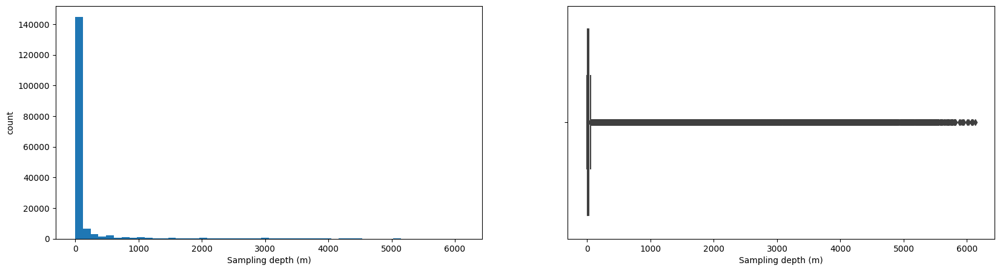

In [18]:
## Plot box plot $ Find Outliers based on IQR
columns_list2 =  ['Latitude (decimal)', 'Longitude (decimal)','Sampling depth (m)']

for i in columns_list2:

  q1 = cleaned_data[i].quantile(0.25)
  q3 = cleaned_data[i].quantile(0.75)
  iqr = q3 - q1
  lower = q1 - 1.5*iqr
  upper = q3 + 1.5*iqr
  outliers = cleaned_data[(cleaned_data[i] < lower) | (cleaned_data[i] > upper)]
  list_outliers = outliers[i].tolist()


  print(f'Outliers in Column {i}:')
  print(' '.join(map(str, list_outliers)))
  print(f'Number of Outliers: {len(list_outliers)}')
  print(f'Lower Bound {lower}, Upper Bound {upper}')
  print('Skew :', round(cleaned_data[i].skew(), 2))


  plt.figure(figsize = (20, 5))
  plt.subplot(1, 2, 1)
  cleaned_data[i].hist(grid=False,bins=50)
  plt.xlabel(f'{i}')
  plt.ylabel('count')
  plt.subplot(1, 2, 2)
  sns.boxplot(x=cleaned_data[i])
  plt.show()

In [19]:
# Fill the -1 in Sampling depth (m) using mdeian grouped by Nuclide, Year, Latitude (decimal), Longitude (decimal)

cleaned_data['Sampling depth (m)'] = cleaned_data['Sampling depth (m)'].replace(-1, np.nan) # Replace -1 with np.nan
cleaned_data['Sampling depth (m)'] = cleaned_data.groupby(['Nuclide', 'Year'], group_keys=True)['Sampling depth (m)'].apply(lambda x: x.fillna(x.median())).values
cleaned_data.describe()

/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


,Latitude (decimal),Longitude (decimal),Sampling depth (m),Activity or MDA
count,169308.000000,169308.000000,169290.000000,1.693080e+05
mean,38.463709,73.467648,170.213200,8.169654e+06
std,18.804529,83.261075,602.950478,4.957608e+08
min,-75.750556,-179.808611,0.000000,-9.999000e+03
25%,37.333333,-1.958333,2.000000,1.900000e+00
50%,37.431111,140.950000,3.000000,4.000000e+01
75%,49.665278,141.042222,24.000000,4.500000e+03
max,89.990000,179.980000,6128.500000,1.580000e+11


In [20]:
cleaned_data.head()

,Sample type,Latitude (decimal),Longitude (decimal),Sampling depth (m),Sampling start datetime,Nuclide,Value type,Activity or MDA,Year
0,Seawater,87.497222,179.841111,3.0,9/14/2015 12:00:00 AM,129I,=,1.390000e+09,2015
1,Seawater,87.497222,179.841111,3.0,9/14/2015 12:00:00 AM,236U/238U,=,1.606000e-09,2015
2,Seawater,87.497222,179.841111,3.0,9/14/2015 12:00:00 AM,236U,=,1.110000e+07,2015
3,Seawater,85.085556,139.978611,2.0,9/21/2015 12:00:00 AM,129I,=,7.310000e+09,2015
4,Seawater,85.085556,139.978611,0.5,9/21/2015 12:00:00 AM,236U/238U,=,2.309000e-09,2015


In [21]:
cleaned_data['Year'] = cleaned_data['Year'].astype(int)
cleaned_data['Year'].unique()

array([2015, 2007, 2006, 2005, 2017, 2001, 2000, 2014, 2010, 2012, 2003,
       2011, 2008, 2009, 2002, 2016, 2013, 2004, 2018, 2019, 2020, 2021])

In [22]:
# Replace T-BETA to 3H. They are the same Nuclide

cleaned_data['Nuclide'] = cleaned_data['Nuclide'].replace('T-BETA', '3H')

## Cancer Data from 2000 to 2016
* Stomach + Colon + Liver + Lung + Bladder
* Argentina + Belgium + Brazil + Denmark + France + Germany + Italy + Japan + Republic of Korea + Mexico + The Netherlands + Portugal + United Kingdom + USA
* (https://gco.iarc.fr/)

In [23]:
cancer_data = pd.read_csv('/content/drive/Shareddrives/Data240_Project/Datasets/Wold_Health_Organiztion_Cancer_data/dataset-absolute-numbers-mort-males-and-females-stomach-colon-liver-lung-bladder.csv')
cancer_data

,Cancer id,Cancer label,Population id,Country label,Sex,Type,Year,ASR (World),Crude rate,Cumulative risk,Total
0,11_7_3_5_22,"Stomach, Colon, Liver, Lung, Bladder",84000_82600_62000_39200_27600_41000_7600_5600_...,Argentina; Belgium; Brazil; Denmark; France; G...,1,1,2000,72.772539,99.383761,NaN,519913.0
1,11_7_3_5_22,"Stomach, Colon, Liver, Lung, Bladder",84000_82600_62000_39200_27600_41000_7600_5600_...,Argentina; Belgium; Brazil; Denmark; France; G...,1,1,2001,70.888988,98.772860,NaN,520927.5
2,11_7_3_5_22,"Stomach, Colon, Liver, Lung, Bladder",84000_82600_62000_39200_27600_41000_7600_5600_...,Argentina; Belgium; Brazil; Denmark; France; G...,1,1,2002,69.703018,99.010360,NaN,526338.0
3,11_7_3_5_22,"Stomach, Colon, Liver, Lung, Bladder",84000_82600_62000_39200_27600_41000_7600_5600_...,Argentina; Belgium; Brazil; Denmark; France; G...,1,1,2003,68.376279,99.061544,NaN,530719.0
4,11_7_3_5_22,"Stomach, Colon, Liver, Lung, Bladder",84000_82600_62000_39200_27600_41000_7600_5600_...,Argentina; Belgium; Brazil; Denmark; France; G...,1,1,2004,67.183133,99.148534,NaN,535264.0
5,11_7_3_5_22,"Stomach, Colon, Liver, Lung, Bladder",84000_82600_62000_39200_27600_41000_7600_5600_...,Argentina; Belgium; Brazil; Denmark; France; G...,1,1,2005,65.956941,99.302082,NaN,540157.0
6,11_7_3_5_22,"Stomach, Colon, Liver, Lung, Bladder",84000_82600_62000_39200_27600_41000_7600_5600_...,Argentina; Belgium; Brazil; Denmark; France; G...,1,1,2006,64.145759,98.906253,NaN,542028.0
7,11_7_3_5_22,"Stomach, Colon, Liver, Lung, Bladder",84000_82600_62000_39200_27600_41000_7600_5600_...,Argentina; Belgium; Brazil; Denmark; France; G...,1,1,2007,62.723572,98.882958,NaN,545893.0
8,11_7_3_5_22,"Stomach, Colon, Liver, Lung, Bladder",84000_82600_62000_39200_27600_41000_7600_5600_...,Argentina; Belgium; Brazil; Denmark; France; G...,1,1,2008,61.541144,99.096274,NaN,551044.0
9,11_7_3_5_22,"Stomach, Colon, Liver, Lung, Bladder",84000_82600_62000_39200_27600_41000_7600_5600_...,Argentina; Belgium; Brazil; Denmark; France; G...,1,1,2009,59.932340,98.395374,NaN,551067.0


In [24]:
selected_cancer_data = cancer_data.groupby('Year')['Total'].sum().reset_index()
selected_cancer_data.head(17)

,Year,Total
0,2000,821411.0
1,2001,824548.0
2,2002,835887.0
3,2003,844467.0
4,2004,851672.0
5,2005,861622.0
6,2006,866467.0
7,2007,874685.0
8,2008,883419.0
9,2009,884243.0


## Data Analysis

In [25]:
# For 'Nuclide' column
print(cleaned_data['Nuclide'].value_counts())

3H           57803
137Cs        55149
134Cs        27543
90Sr          7082
14C           2590
234Th         2547
239,240Pu     2298
226Ra         1830
99Tc          1729
230Th         1411
231Pa         1292
T-ALPHA       1061
228Ra          863
129I           778
131I           645
236U           631
210Po          518
210Pb          510
40K            500
224Ra          414
223Ra          348
228Th          331
238U           166
236U/238U      144
134,137Cs      120
233U           100
238Pu           96
240Pu           82
239Pu           82
7Be             80
241Am           68
106Ru           57
89Sr            55
237Np           54
136Cs           54
132I            50
132Te           39
125Sb           34
140La           31
60Co            30
140Ba           26
232Th           24
241Pu           15
99mTc            8
58Co             7
105Ru            4
129Te            3
129mTe           2
234U             1
95Zr             1
99Mo             1
135I             1
Name: Nuclid

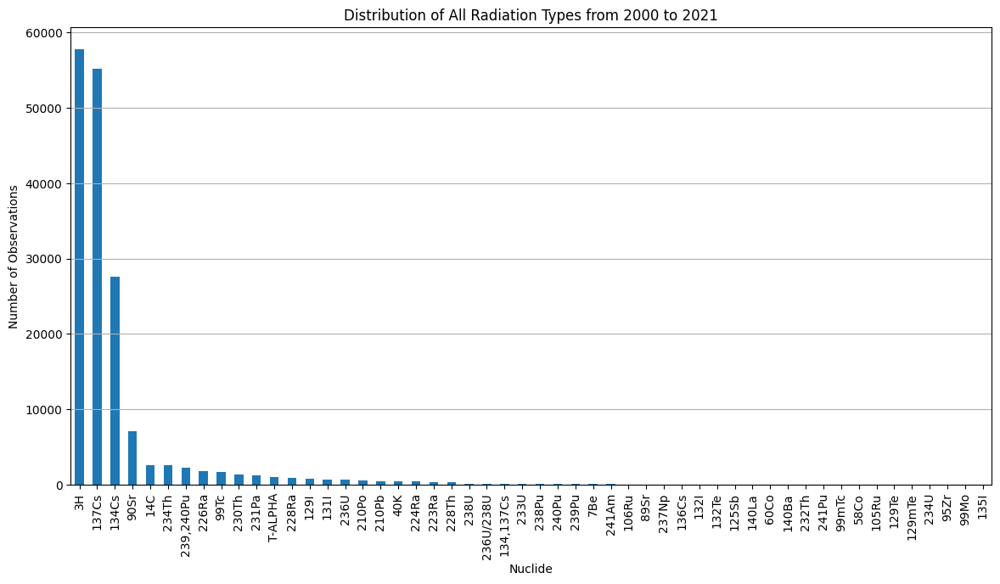

In [26]:
plt.figure(figsize=(14, 7))
cleaned_data['Nuclide'].value_counts().plot(kind='bar')
plt.title('Distribution of All Radiation Types from 2000 to 2021')
plt.xlabel('Nuclide')
plt.ylabel('Number of Observations')
plt.grid(axis='y')
plt.show()

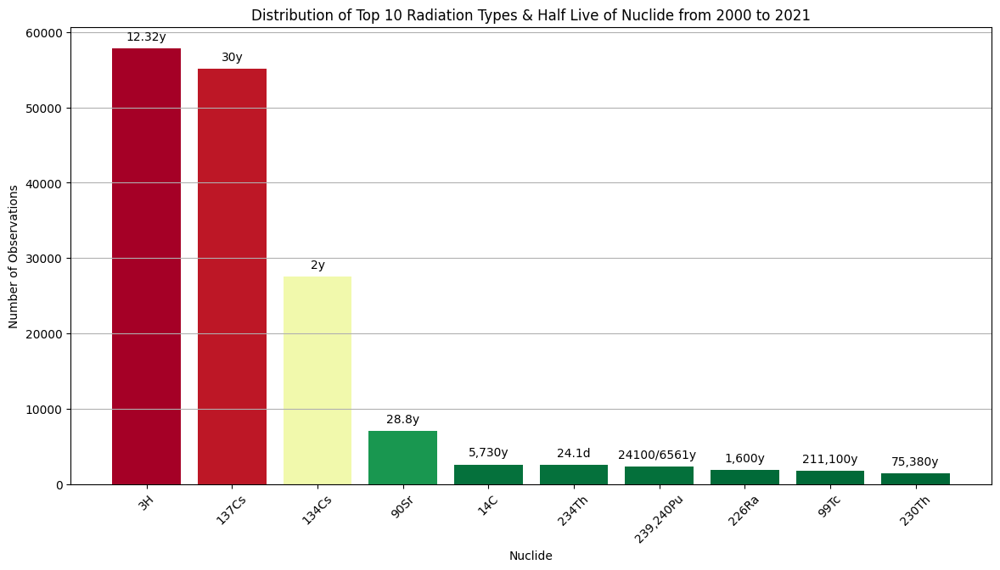

In [27]:
top_10_nuclides = cleaned_data['Nuclide'].value_counts().head(10)

half_lives = {
    '3H': '12.32y',
    '137Cs': '30y',
    '134Cs': '2y',
    '90Sr': '28.8y',
    '14C': '5,730y',
    '234Th': '24.1d',
    '239,240Pu': '24100/6561y ',
    '226Ra': '1,600y',
    '99Tc' : '211,100y',
    '230Th' : '75,380y'
}

# Normalize the observation counts
norm = plt.Normalize(top_10_nuclides.min(), top_10_nuclides.max())

# Use a colormap to map normalized values to colors
colors = plt.cm.RdYlGn_r(norm(top_10_nuclides.values))

plt.figure(figsize=(14, 7))
bars = plt.bar(top_10_nuclides.index, top_10_nuclides.values, color=colors)
plt.title('Distribution of Top 10 Radiation Types & Half Live of Nuclide from 2000 to 2021')
plt.xlabel('Nuclide')
plt.ylabel('Number of Observations')
plt.xticks(rotation=45)
plt.grid(axis='y')

# Annotate each bar with the respective half-life
nuclide_names = top_10_nuclides.index

for index, bar in enumerate(bars):
    nuclide = bar.get_x() + bar.get_width() / 2  # Position of text
    value = half_lives.get(nuclide_names[index], 'N/A')  # Fetch half-life from dictionary or 'N/A' if not found
    plt.annotate(value, (nuclide, bar.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.show()

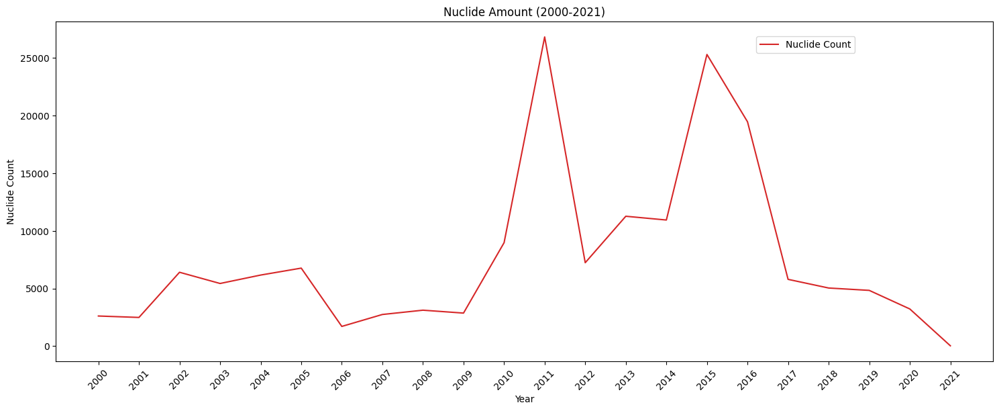

In [28]:
# Show the Trend of the amount of Nuclide from 2000 to 2021
grouped_nuclide = cleaned_data.groupby('Year')['Nuclide'].count().reset_index().rename(columns={'Nuclide': 'Nuclide_Count'})

fig, ax1 = plt.subplots(figsize=(15, 6))

color = 'tab:red'
ax1.set_xlabel('Year')
ax1.set_ylabel('Nuclide Count')
ax1.plot(grouped_nuclide['Year'], grouped_nuclide['Nuclide_Count'], color=color, label='Nuclide Count')

years = list(range(2000, 2022))  # List of years from 2000 to 2021
ax1.set_xticks(years)
ax1.set_xticklabels(years, rotation=45)  # Rotate the labels for better visibility

ax1.tick_params(axis='y')

fig.tight_layout()
fig.legend(loc='upper left', bbox_to_anchor=(0.75, 0.95))
plt.title('Nuclide Amount (2000-2021)')
plt.show()


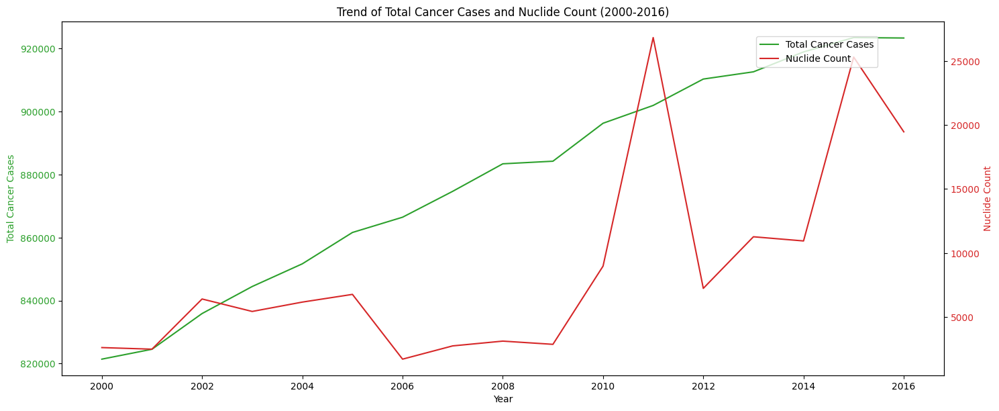

In [29]:
# Group by Year and count Nuclide and plot it with cancer data from 2000 to 2016
selected_cancer_data['Year'] = selected_cancer_data['Year'].astype(int)
grouped_nuclide['Year'] = grouped_nuclide['Year'].astype(int)
grouped_nuclide = cleaned_data.groupby('Year')['Nuclide'].count().reset_index().rename(columns={'Nuclide': 'Nuclide_Count'})
grouped_nuclide = grouped_nuclide[grouped_nuclide['Year'] <= 2016]

# Merging the two processed DataFrames
merged_data = pd.merge(selected_cancer_data, grouped_nuclide, on='Year', how='outer').sort_values(by='Year')

fig, ax1 = plt.subplots(figsize=(15, 6))

color = 'tab:green'
ax1.set_xlabel('Year')
ax1.set_ylabel('Total Cancer Cases', color=color)
ax1.plot(merged_data['Year'], merged_data['Total'], color=color, label='Total Cancer Cases') # Added label
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Nuclide Count', color=color)
ax2.plot(merged_data['Year'], merged_data['Nuclide_Count'], color=color, label='Nuclide Count') # Added label
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
fig.legend(loc='upper left', bbox_to_anchor=(0.75, 0.95))  # Display the legend
plt.title('Trend of Total Cancer Cases and Nuclide Count (2000-2016)')
plt.show()

In [30]:
# How 137Cs spread. to the world

import plotly.express as px
import pandas as pd
import numpy as np

cleaned_data1 = cleaned_data[cleaned_data['Nuclide'] == '137Cs']
data_grouped1 = cleaned_data1.groupby(['Latitude (decimal)', 'Longitude (decimal)']).agg({
    'Nuclide': 'count'
}).reset_index()

# Adding a column for logarithmic scale for better visualization
data_grouped1['log_Activity'] = data_grouped1['Nuclide'].apply(lambda x: 0 if x <= 0 else np.log(x))

# Offset for log values to ensure all are positive and divide by a factor to reduce size
min_log_activity = data_grouped1['log_Activity'].min()
data_grouped1['adjusted_log_Activity'] = (data_grouped1['log_Activity'] + abs(min_log_activity) + 1) / 4  # dividing by a factor of 4

# Adding a column for logarithmic scale for better visualization
data_grouped1['log_Activity'] = data_grouped1['Nuclide'].apply(lambda x: 0 if x <= 0 else np.log(x))

# Offset for log values to ensure all are positive and divide by a factor to reduce size
min_log_activity = data_grouped1['log_Activity'].min()
data_grouped1['adjusted_log_Activity'] = (data_grouped1['log_Activity'] + abs(min_log_activity) + 1) / 4  # dividing by a factor of 4

# Set up your mapbox access token
px.set_mapbox_access_token('YOUR_MAPBOX_ACCESS_TOKEN')

fig = px.scatter_mapbox(data_grouped1,
                        lat='Latitude (decimal)',
                        lon='Longitude (decimal)',
                        size='adjusted_log_Activity',
                        #color='puple',
                        size_max=15,  # Reduced max size
                        color_continuous_scale=px.colors.sequential.Plasma,
                        zoom=1,  # Starting zoom level
                        opacity=0.5,
                        title="Nuclear Waste Amount for 137Cs",
                        mapbox_style="carto-positron")  # You can choose other styles
fig.update_layout(width=1200, height=800)
fig.show()



In [31]:
# Nuclear waste Level in 2014
import plotly.express as px
import pandas as pd
import numpy as np

cleaned_data1 = cleaned_data[cleaned_data['Year'] == 2014]

# Calculate the median 'Activity or MDA' for each 'Nuclide' in 2014
medians = cleaned_data1.groupby('Nuclide')['Activity or MDA'].median().sort_values(ascending=False)

# Take the top N Nuclide types, for example, top 10
top_n_nuclides = medians.head(30).index

# Grouping and aggregating data from cleaned_data1
data_grouped2 = cleaned_data1.groupby(['Latitude (decimal)', 'Longitude (decimal)']).agg({
    'Activity or MDA': 'mean',
    'Nuclide': lambda x: x.iloc[0] if x.iloc[0] in top_n_nuclides else None
}).dropna().reset_index()

# Adding a column for logarithmic scale for better visualization
data_grouped2['log_Activity'] = data_grouped2['Activity or MDA'].apply(lambda x: 0 if x <= 0 else np.log(x))

# Offset for log values to ensure all are positive and divide by a factor to reduce size
min_log_activity = data_grouped2['log_Activity'].min()
data_grouped2['adjusted_log_Activity'] = (data_grouped2['log_Activity'] + abs(min_log_activity) + 1) / 4

# Set up your mapbox access token
px.set_mapbox_access_token('YOUR_MAPBOX_ACCESS_TOKEN')

fig = px.density_mapbox(data_grouped2,
                        lat='Latitude (decimal)',
                        lon='Longitude (decimal)',
                        z='adjusted_log_Activity',
                        radius=10, # Defines the radius (in meters) of the circles used to draw the heatmap.
                        center=dict(lat=0, lon=180),
                        zoom=1,
                        mapbox_style="carto-positron",
                        title="Nuclear Waste Levels Around the World in 2014")
#fig = px.scatter_mapbox(data_grouped2,
#                        lat='Latitude (decimal)',
#                        lon='Longitude (decimal)',
#                        size='adjusted_log_Activity',
#                        color='adjusted_log_Activity',
#                        hover_name='Nuclide',
#                        size_max=15,
#                        color_continuous_scale=px.colors.sequential.Plasma,
#                        zoom=1,
#                        opacity=0.5,
#                        title="Nuclear Waste Levels for Top Nuclides in 2015",
 #                       mapbox_style="carto-positron")
fig.update_layout(width=1200, height=800)
fig.show()

In [32]:
# Nuclear waste Level in 2015
import plotly.express as px
import pandas as pd
import numpy as np

cleaned_data1 = cleaned_data[cleaned_data['Year'] == 2015]

# Calculate the median 'Activity or MDA' for each 'Nuclide' in 2015
medians = cleaned_data1.groupby('Nuclide')['Activity or MDA'].median().sort_values(ascending=False)

# Take the top N Nuclide types, for example, top 10
top_n_nuclides = medians.head(30).index

# Grouping and aggregating data from cleaned_data1
data_grouped2 = cleaned_data1.groupby(['Latitude (decimal)', 'Longitude (decimal)']).agg({
    'Activity or MDA': 'mean',
    'Nuclide': lambda x: x.iloc[0] if x.iloc[0] in top_n_nuclides else None
}).dropna().reset_index()

# Adding a column for logarithmic scale for better visualization
data_grouped2['log_Activity'] = data_grouped2['Activity or MDA'].apply(lambda x: 0 if x <= 0 else np.log(x))

# Offset for log values to ensure all are positive and divide by a factor to reduce size
min_log_activity = data_grouped2['log_Activity'].min()
data_grouped2['adjusted_log_Activity'] = (data_grouped2['log_Activity'] + abs(min_log_activity) + 1) / 4

# Set up your mapbox access token
px.set_mapbox_access_token('YOUR_MAPBOX_ACCESS_TOKEN')

fig = px.density_mapbox(data_grouped2,
                        lat='Latitude (decimal)',
                        lon='Longitude (decimal)',
                        z='adjusted_log_Activity',
                        radius=10, # Defines the radius (in meters) of the circles used to draw the heatmap.
                        center=dict(lat=0, lon=180),
                        zoom=1,
                        mapbox_style="carto-positron",
                        title="Nuclear Waste Levels Around the World in 2015")

fig.update_layout(width=1200, height=800)
fig.show()


In [34]:
import plotly.express as px
import pandas as pd
import numpy as np

# Function to generate a map visualization for a given set of years
def generate_map_for_years(years, title):
    # Filter data for the given years
    cleaned_data_filtered = cleaned_data[cleaned_data['Year'].isin(years)]

    # Calculate the median 'Activity or MDA' for each 'Nuclide' in the filtered years
    medians = cleaned_data_filtered.groupby('Nuclide')['Activity or MDA'].median().sort_values(ascending=False)

    # Take the top N Nuclide types, for example, top 30
    top_n_nuclides = medians.head(30).index

    # Grouping and aggregating data
    data_grouped = cleaned_data_filtered.groupby(['Latitude (decimal)', 'Longitude (decimal)']).agg({
        'Activity or MDA': 'mean',
        'Nuclide': lambda x: x.iloc[0] if x.iloc[0] in top_n_nuclides else None
    }).dropna().reset_index()

    # Adding a column for logarithmic scale for better visualization
    data_grouped['log_Activity'] = data_grouped['Activity or MDA'].apply(lambda x: 0 if x <= 0 else np.log(x))

    # Offset for log values to ensure all are positive and divide by a factor to reduce size
    min_log_activity = data_grouped['log_Activity'].min()
    data_grouped['adjusted_log_Activity'] = (data_grouped['log_Activity'] + abs(min_log_activity) + 1) / 4

    # Set up your mapbox access token
    px.set_mapbox_access_token('YOUR_MAPBOX_ACCESS_TOKEN')

    # Create the visualization
    fig = px.density_mapbox(data_grouped,
                            lat='Latitude (decimal)',
                            lon='Longitude (decimal)',
                            z='adjusted_log_Activity',
                            radius=10,
                            center=dict(lat=0, lon=180),
                            zoom=1,
                            mapbox_style="carto-positron",
                            title=title)
    fig.update_layout(width=1200, height=800)
    fig.show()

# Generate map for 1999-2010
generate_map_for_years(list(range(1999, 2011)), "Nuclear Waste Levels Around the World (1999-2010)")

# Generate map for 2011 to now (replace the end year with the latest year in your dataset)
generate_map_for_years(list(range(2011, 2023)), "Nuclear Waste Levels Around the World (2011-now)")


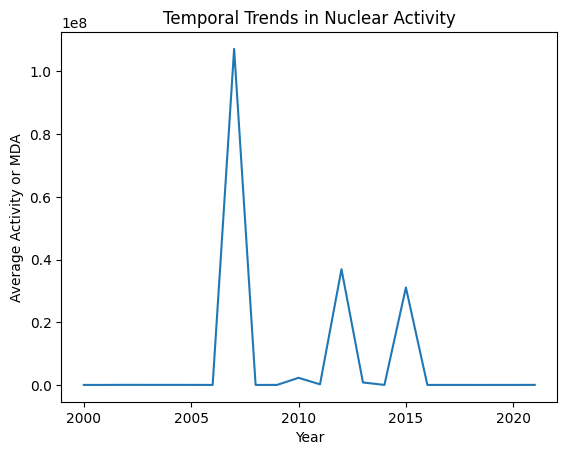

In [33]:
## Temporal Trends (assuming 'Sampling start datetime' as the date field)
cleaned_data['Sampling start datetime'] = pd.to_datetime(cleaned_data['Sampling start datetime'])
temporal_trend = cleaned_data.groupby(cleaned_data['Sampling start datetime'].dt.year)['Activity or MDA'].mean()
temporal_trend.plot()
plt.title("Temporal Trends in Nuclear Activity")
plt.ylabel("Average Activity or MDA")
plt.xlabel("Year")
plt.show()

Number of Anomalies: 218


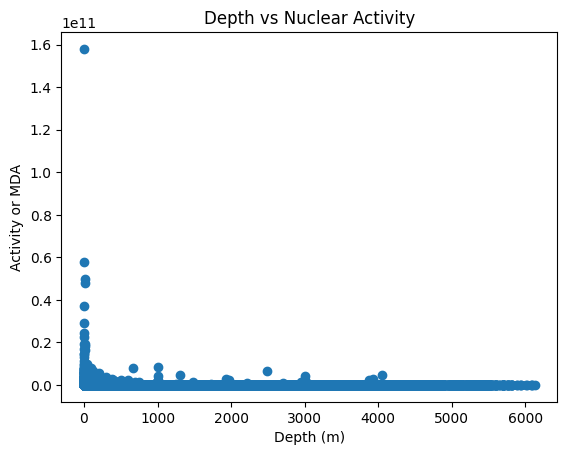

In [ ]:
# 5. Data Analysis 2: Underlying Structures and Deviations

## Anomalies (using z-score as a simplistic method)
from scipy.stats import zscore
cleaned_data['z_score'] = zscore(cleaned_data['Activity or MDA'])
anomalies = cleaned_data[cleaned_data['z_score'].abs() > 3]
print("Number of Anomalies:", len(anomalies))

## Underlying Structures: Depth vs Activity
plt.scatter(cleaned_data['Sampling depth (m)'], cleaned_data['Activity or MDA'])
plt.title("Depth vs Nuclear Activity")
plt.ylabel("Activity or MDA")
plt.xlabel("Depth (m)")
plt.show()

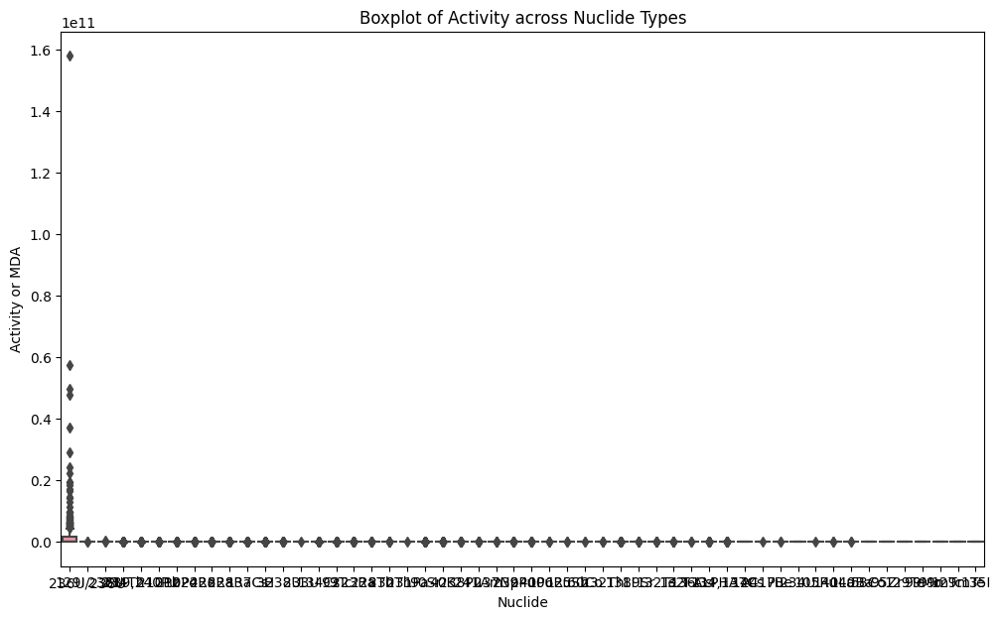

In [ ]:
# Example for 'Activity or MDA' across different 'Nuclide' types
plt.figure(figsize=(12, 7))
sns.boxplot(x='Nuclide', y='Activity or MDA', data=cleaned_data)
plt.title("Boxplot of Activity across Nuclide Types")
plt.show()


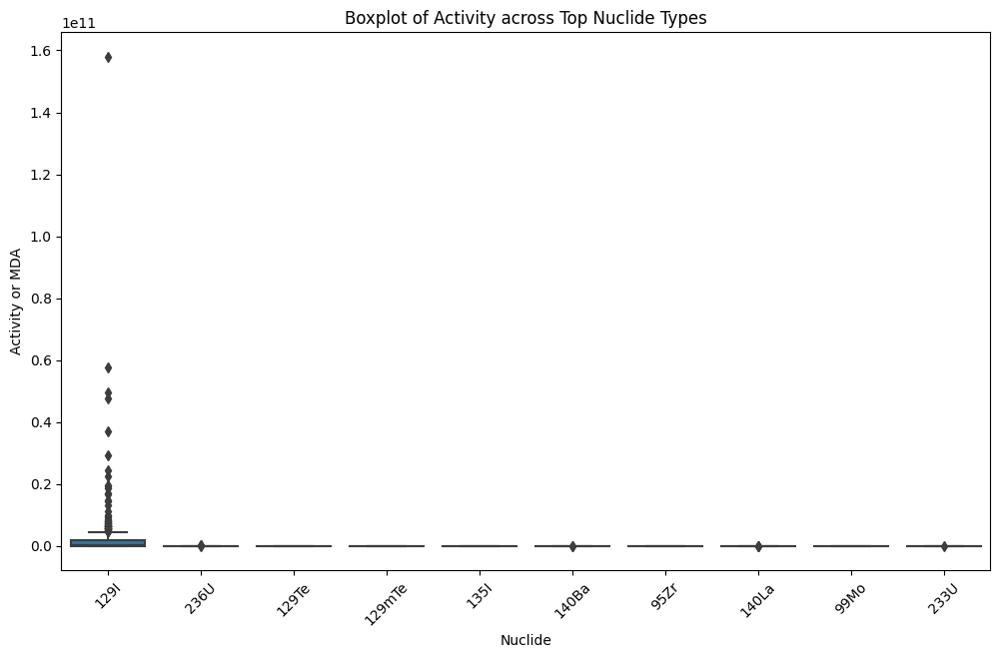

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the median 'Activity or MDA' for each 'Nuclide'
medians = cleaned_data.groupby('Nuclide')['Activity or MDA'].median().sort_values(ascending=False)

# Filter out Nuclide types with median 'Activity or MDA' less than a threshold (e.g., < 1)
selected_nuclides = medians[medians > 1].index

# Take the top N Nuclide types, for example, top 10
top_n_nuclides = selected_nuclides[:10]

# Filter the data for these Nuclide types
filtered_data = cleaned_data[cleaned_data['Nuclide'].isin(top_n_nuclides)]

# Plot the data
plt.figure(figsize=(12, 7))
sns.boxplot(x='Nuclide', y='Activity or MDA', data=filtered_data, order=top_n_nuclides)
plt.title("Boxplot of Activity across Top Nuclide Types")
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.show()


In [ ]:
# For example, check unique values for 'Nuclide'
print(cleaned_data['Nuclide'].unique())


['3H' '134Cs' '137Cs' '106Ru' '125Sb' '60Co' '233U' '238U' '236U'
 '236U/238U' '129I' '226Ra' '228Ra' '234Th' '239,240Pu' '99Tc' '210Po'
 '210Pb' '224Ra' '230Th' '231Pa' 'T-BETA' 'T-ALPHA' '90Sr' '131I' '238Pu'
 '132I' '136Cs' '58Co' '89Sr' '134,137Cs' '132Te' '133I' '144Ce' '54Mn'
 '140La' '140Ba' '105Ru' '40K' '223Ra' '239Pu' '240Pu' '241Pu' '110mAg'
 '7Be' '228Th' '237Np' '241Am' '232Th' '234U' '14C' '95Zr' '129Te' '99Mo'
 '99mTc' '129mTe' '135I']


In [ ]:
import plotly.express as px
import pandas as pd
import numpy as np

# Calculate the median 'Activity or MDA' for each 'Nuclide'
medians = cleaned_data.groupby('Nuclide')['Activity or MDA'].median().sort_values(ascending=False)

# Take the top N Nuclide types, for example, top 10
top_n_nuclides = medians.head(30).index

# Assuming cleaned_data is your DataFrame
data_grouped = cleaned_data.groupby(['Latitude (decimal)', 'Longitude (decimal)']).agg({
    'Activity or MDA': 'mean',
    'Nuclide': lambda x: x.iloc[0] if x.iloc[0] in top_n_nuclides else None  # Only get Nuclide if it's in the top list
}).dropna().reset_index()  # Drop rows with None

# Adding a column for logarithmic scale for better visualization
data_grouped['log_Activity'] = data_grouped['Activity or MDA'].apply(lambda x: 0 if x <= 0 else np.log(x))

# Offset for log values to ensure all are positive and divide by a factor to reduce size
min_log_activity = data_grouped['log_Activity'].min()
data_grouped['adjusted_log_Activity'] = (data_grouped['log_Activity'] + abs(min_log_activity) + 1) / 4  # dividing by a factor of 4

# Set up your mapbox access token
px.set_mapbox_access_token('YOUR_MAPBOX_ACCESS_TOKEN')

fig = px.scatter_mapbox(data_grouped,
                        lat='Latitude (decimal)',
                        lon='Longitude (decimal)',
                        size='adjusted_log_Activity',
                        color='adjusted_log_Activity',
                        hover_name='Nuclide',
                        size_max=15,  # Reduced max size
                        color_continuous_scale=px.colors.sequential.Plasma,
                        zoom=1,  # Starting zoom level
                        opacity=0.5,
                        title="Nuclear Waste Levels for Top Nuclides",
                        mapbox_style="carto-positron")  # You can choose other styles
fig.update_layout(width=1200, height=800)
fig.show()



In [ ]:
print(data_grouped['Latitude (decimal)'].min(), data_grouped['Latitude (decimal)'].max())
print(data_grouped['Longitude (decimal)'].min(), data_grouped['Longitude (decimal)'].max())


-75.75055555555555 89.9875
-179.80861111111113 179.98


In [ ]:
import pandas as pd

# URL of the Wikipedia page
url = "https://en.wikipedia.org/wiki/List_of_nuclear_power_stations"

# Read all tables from the Wikipedia page into a list of dataframes
tables = pd.read_html(url)

# Save the first table (or whichever you want) as a CSV
tables[0].to_csv("output.csv", index=False)


In [ ]:
tables[1].head()

,Power station,# units [note 1],Capacity (MWe) [note 2],Country or Territory,Location,.mw-parser-output .tooltip-dotted{border-bottom:1px dotted;cursor:help}Refs
0,Akademik Lomonosov,2,64,Russia,".mw-parser-output .geo-default,.mw-parser-outp...",NaN
1,Akkuyu,4,3200,Turkey,36°08′40″N 33°32′28″E﻿ / ﻿36.14444°N 33.54111°E,NaN
2,Almaraz,2,2017,Spain,39°48′29″N 05°41′49″W﻿ / ﻿39.80806°N 5.69694°W,NaN
3,Angra,2,"1,884[note 3]",Brazil,23°00′30″S 44°28′26″W﻿ / ﻿23.00833°S 44.47389°W,NaN
4,ANO,2,1839,United States,35°18′37″N 93°13′53″W﻿ / ﻿35.31028°N 93.23139°W,NaN


In [ ]:
df = tables[1]

In [ ]:
df['Location'][0] = '69°42′35″N 170°18′22″E\ufeff / \ufeff69.7097°N 170.3061°E'

<ipython-input-47-82a4aac6b372>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df

,Power station,# units [note 1],Capacity (MWe) [note 2],Country or Territory,Location,.mw-parser-output .tooltip-dotted{border-bottom:1px dotted;cursor:help}Refs
0,Akademik Lomonosov,2,64,Russia,69°42′35″N 170°18′22″E﻿ / ﻿69.7097°N 170.3061°E,NaN
1,Akkuyu,4,3200,Turkey,36°08′40″N 33°32′28″E﻿ / ﻿36.14444°N 33.54111°E,NaN
2,Almaraz,2,2017,Spain,39°48′29″N 05°41′49″W﻿ / ﻿39.80806°N 5.69694°W,NaN
3,Angra,2,"1,884[note 3]",Brazil,23°00′30″S 44°28′26″W﻿ / ﻿23.00833°S 44.47389°W,NaN
4,ANO,2,1839,United States,35°18′37″N 93°13′53″W﻿ / ﻿35.31028°N 93.23139°W,NaN
...,...,...,...,...,...,...
169,Watts Bar,2,2288,United States,35°36′10″N 84°47′22″W﻿ / ﻿35.60278°N 84.78944°W,NaN
170,Wolf Creek,1,1160,United States,38°14′20″N 95°41′20″W﻿ / ﻿38.23889°N 95.68889°W,NaN
171,Wolseong,5,"3,835[note 49]",South Korea,35°42′40″N 129°28′30″E﻿ / ﻿35.71111°N 129.47500°E,NaN
172,Yangjiang,6,6000,China,21°42′35″N 112°15′38″E﻿ / ﻿21.70972°N 112.26056°E,[8]


In [ ]:
# df.drop(df.columns[-1], axis=1, inplace=True)

In [ ]:
# Clean '[note xx]' patterns from column names
df.columns = df.columns.str.replace(r'\[note \d+\]', '', regex=True)

# Remove '[note xx]' patterns from DataFrame cells
df = df.replace(to_replace=r'\[note \d+\]', value='', regex=True)

# Clean the 'Capacity (MWe)' column (assuming it might contain commas or other characters)
if 'Capacity (MWe)' in df.columns:
    df['Capacity (MWe)'] = df['Capacity (MWe)'].str.replace(',', '', regex=True).astype(float)

df.head()


,Power station,# units,Capacity (MWe),Country or Territory,Location,.mw-parser-output .tooltip-dotted{border-bottom:1px dotted;cursor:help}Refs
0,Akademik Lomonosov,2,64,Russia,69°42′35″N 170°18′22″E﻿ / ﻿69.7097°N 170.3061°E,NaN
1,Akkuyu,4,3200,Turkey,36°08′40″N 33°32′28″E﻿ / ﻿36.14444°N 33.54111°E,NaN
2,Almaraz,2,2017,Spain,39°48′29″N 05°41′49″W﻿ / ﻿39.80806°N 5.69694°W,NaN
3,Angra,2,"1,884",Brazil,23°00′30″S 44°28′26″W﻿ / ﻿23.00833°S 44.47389°W,NaN
4,ANO,2,1839,United States,35°18′37″N 93°13′53″W﻿ / ﻿35.31028°N 93.23139°W,NaN


In [ ]:
# Extracting decimal latitude and longitude from the 'Location' column
def extract_decimal_coordinates(s):
    parts = s.split('/')
    if len(parts) > 1:
        lat_str, lon_str = parts[1].strip().split()[:2]
        lat_str = lat_str.replace('\ufeff', '').rstrip('°N°S')
        lon_str = lon_str.replace('\ufeff', '').rstrip('°E°W')
        return float(lat_str), float(lon_str)
    return None, None

coords = df['Location'].apply(extract_decimal_coordinates)
df['Latitude (decimal)'], df['Longitude (decimal)'] = zip(*coords)


In [ ]:
df

,Power station,# units,Capacity (MWe),Country or Territory,Location,.mw-parser-output .tooltip-dotted{border-bottom:1px dotted;cursor:help}Refs,Latitude (decimal),Longitude (decimal)
0,Akademik Lomonosov,2,64,Russia,69°42′35″N 170°18′22″E﻿ / ﻿69.7097°N 170.3061°E,NaN,69.70970,170.30610
1,Akkuyu,4,3200,Turkey,36°08′40″N 33°32′28″E﻿ / ﻿36.14444°N 33.54111°E,NaN,36.14444,33.54111
2,Almaraz,2,2017,Spain,39°48′29″N 05°41′49″W﻿ / ﻿39.80806°N 5.69694°W,NaN,39.80806,5.69694
3,Angra,2,"1,884",Brazil,23°00′30″S 44°28′26″W﻿ / ﻿23.00833°S 44.47389°W,NaN,23.00833,44.47389
4,ANO,2,1839,United States,35°18′37″N 93°13′53″W﻿ / ﻿35.31028°N 93.23139°W,NaN,35.31028,93.23139
...,...,...,...,...,...,...,...,...
169,Watts Bar,2,2288,United States,35°36′10″N 84°47′22″W﻿ / ﻿35.60278°N 84.78944°W,NaN,35.60278,84.78944
170,Wolf Creek,1,1160,United States,38°14′20″N 95°41′20″W﻿ / ﻿38.23889°N 95.68889°W,NaN,38.23889,95.68889
171,Wolseong,5,"3,835",South Korea,35°42′40″N 129°28′30″E﻿ / ﻿35.71111°N 129.47500°E,NaN,35.71111,129.47500
172,Yangjiang,6,6000,China,21°42′35″N 112°15′38″E﻿ / ﻿21.70972°N 112.26056°E,[8],21.70972,112.26056


In [ ]:
# Convert longitude to negative for Western Hemisphere locations
df.loc[df['Location'].str.contains('W'), 'Longitude (decimal)'] *= -1
# Convert latitude to negative for Southern Hemisphere locations
df.loc[df['Location'].str.contains('S'), 'Latitude (decimal)'] *= -1


In [ ]:
df

,Power station,# units,Capacity (MWe),Country or Territory,Location,.mw-parser-output .tooltip-dotted{border-bottom:1px dotted;cursor:help}Refs,Latitude (decimal),Longitude (decimal)
0,Akademik Lomonosov,2,64,Russia,69°42′35″N 170°18′22″E﻿ / ﻿69.7097°N 170.3061°E,NaN,69.70970,170.30610
1,Akkuyu,4,3200,Turkey,36°08′40″N 33°32′28″E﻿ / ﻿36.14444°N 33.54111°E,NaN,36.14444,33.54111
2,Almaraz,2,2017,Spain,39°48′29″N 05°41′49″W﻿ / ﻿39.80806°N 5.69694°W,NaN,39.80806,-5.69694
3,Angra,2,"1,884",Brazil,23°00′30″S 44°28′26″W﻿ / ﻿23.00833°S 44.47389°W,NaN,-23.00833,-44.47389
4,ANO,2,1839,United States,35°18′37″N 93°13′53″W﻿ / ﻿35.31028°N 93.23139°W,NaN,35.31028,-93.23139
...,...,...,...,...,...,...,...,...
169,Watts Bar,2,2288,United States,35°36′10″N 84°47′22″W﻿ / ﻿35.60278°N 84.78944°W,NaN,35.60278,-84.78944
170,Wolf Creek,1,1160,United States,38°14′20″N 95°41′20″W﻿ / ﻿38.23889°N 95.68889°W,NaN,38.23889,-95.68889
171,Wolseong,5,"3,835",South Korea,35°42′40″N 129°28′30″E﻿ / ﻿35.71111°N 129.47500°E,NaN,35.71111,129.47500
172,Yangjiang,6,6000,China,21°42′35″N 112°15′38″E﻿ / ﻿21.70972°N 112.26056°E,[8],21.70972,112.26056


In [ ]:
import plotly.graph_objects as go

# Base figure for nuclear waste data
fig = px.scatter_mapbox(data_grouped,
                        lat='Latitude (decimal)',
                        lon='Longitude (decimal)',
                        size='adjusted_log_Activity',
                        color='adjusted_log_Activity',
                        hover_name='Nuclide',
                        hover_data=["Activity or MDA", "adjusted_log_Activity"],
                        size_max=15,
                        color_continuous_scale=px.colors.sequential.Plasma,
                        zoom=1,
                        opacity=0.5,
                        title="Nuclear Waste Levels and Power Stations Around the World",
                        mapbox_style="carto-positron")

# Extract coordinates for the nuclear stations
nuclear_stations_lat = df['Latitude (decimal)']
nuclear_stations_lon = df['Longitude (decimal)']
nuclear_stations_names = df['Power station']

# Add a scatter trace for nuclear stations
fig.add_trace(go.Scattermapbox(
    lat=nuclear_stations_lat,
    lon=nuclear_stations_lon,
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=8,  # size of the nuclear station markers
        color='green',  # color of the nuclear station markers
        symbol='circle'  # shape of the markers
    ),
    text=nuclear_stations_names,  # display station names on hover
    hoverinfo='text',
    name='Power Plant'
))

# Adjust colorbar and legend positions
fig.update_layout(
    coloraxis_colorbar_x=1.05,  # Adjust this value to move the color bar further to the right
    coloraxis_colorbar_y=0.5,  # Adjust this value to move the color bar vertically
    legend_x=0.8,  # Adjust this value to move the legend horizontally
    legend_y=0.1   # Adjust this value to move the legend vertically
)
fig.update_layout(width=1200, height=800)
fig.show()


In [ ]:
import plotly.express as px

fig = px.density_mapbox(data_grouped,
                        lat='Latitude (decimal)',
                        lon='Longitude (decimal)',
                        z='adjusted_log_Activity',
                        radius=10, # Defines the radius (in meters) of the circles used to draw the heatmap.
                        center=dict(lat=0, lon=180),
                        zoom=1,
                        mapbox_style="carto-positron",
                        title="Nuclear Waste Levels Around the World")

# Add power plants
fig.add_trace(go.Scattermapbox(
    lat=df['Latitude (decimal)'],
    lon=df['Longitude (decimal)'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=8,
        color='green'
    ),
    text=df['Power station'],
    hoverinfo='text',
    name='Power Plant'
))
fig.update_layout(width=1200, height=800)
fig.show()


<ipython-input-118-a14cbff28257>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



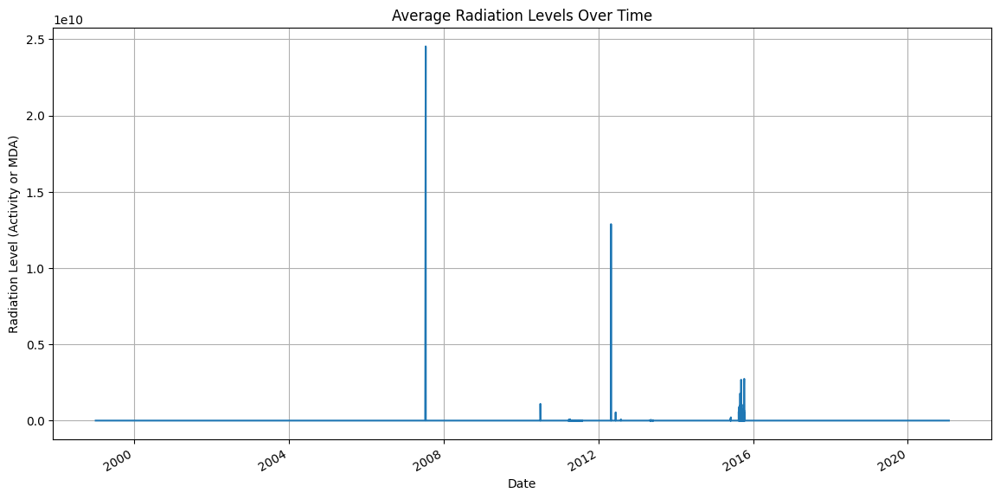

In [ ]:
import matplotlib.pyplot as plt

# Convert 'Sampling start datetime' to datetime object
cleaned_data['Sampling start datetime'] = pd.to_datetime(cleaned_data['Sampling start datetime'])

# Plotting
plt.figure(figsize=(14, 7))
cleaned_data.groupby('Sampling start datetime')['Activity or MDA'].mean().plot()
plt.title('Average Radiation Levels Over Time')
plt.xlabel('Date')
plt.ylabel('Radiation Level (Activity or MDA)')
plt.grid(True)
plt.show()


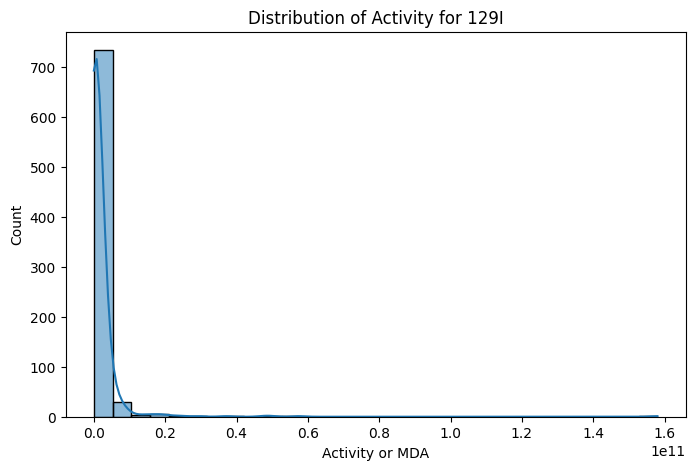

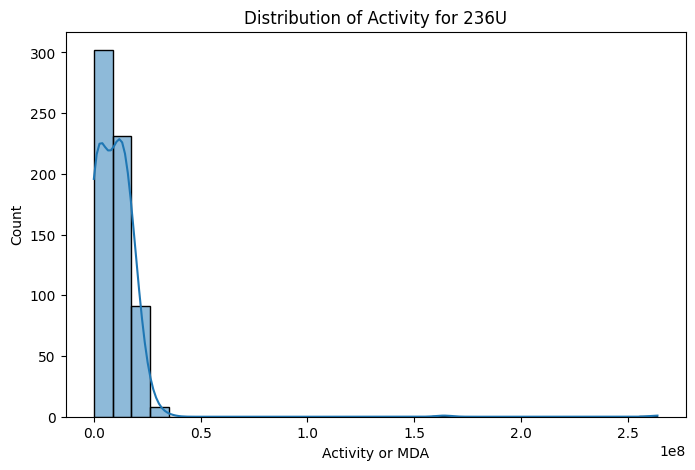

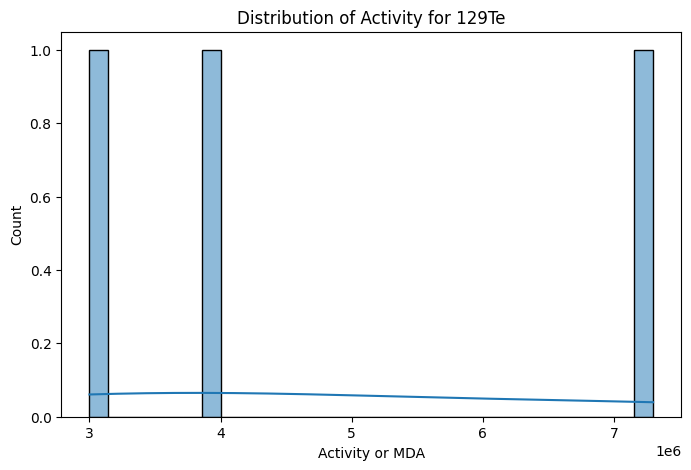

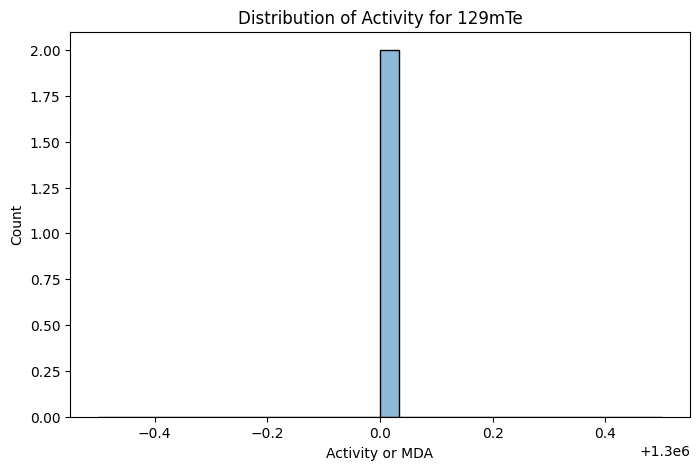

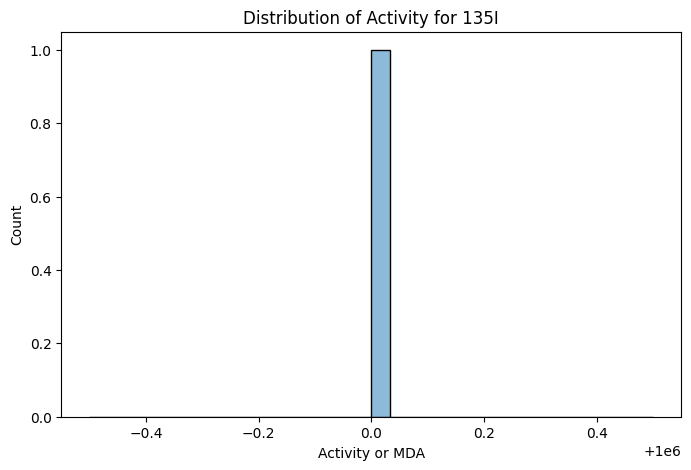

...

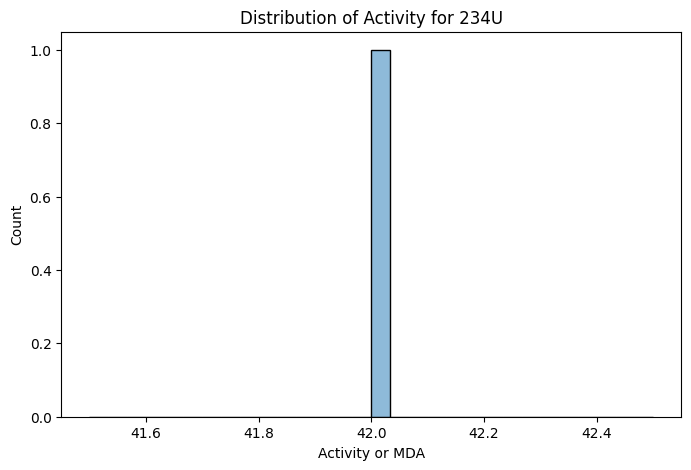

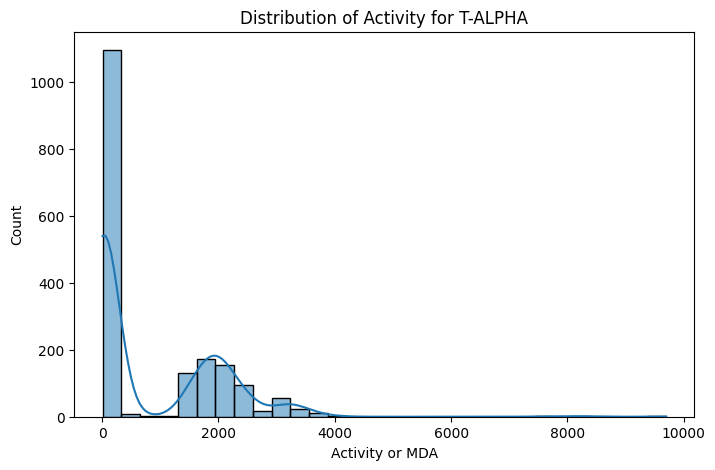

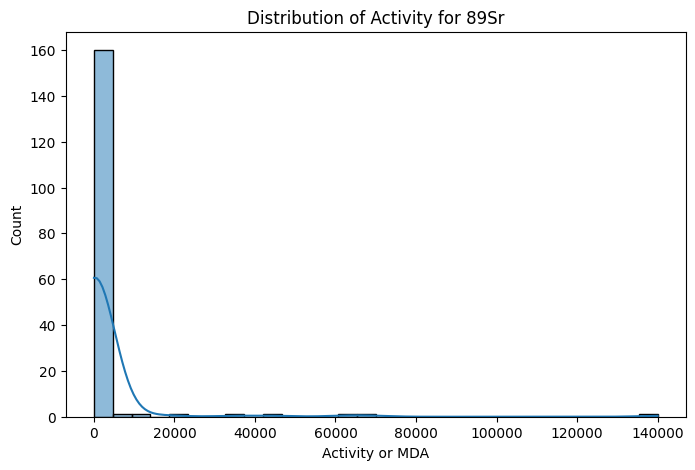

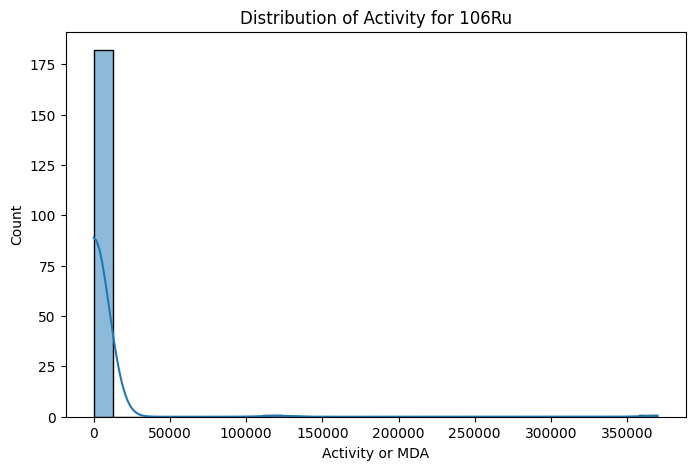

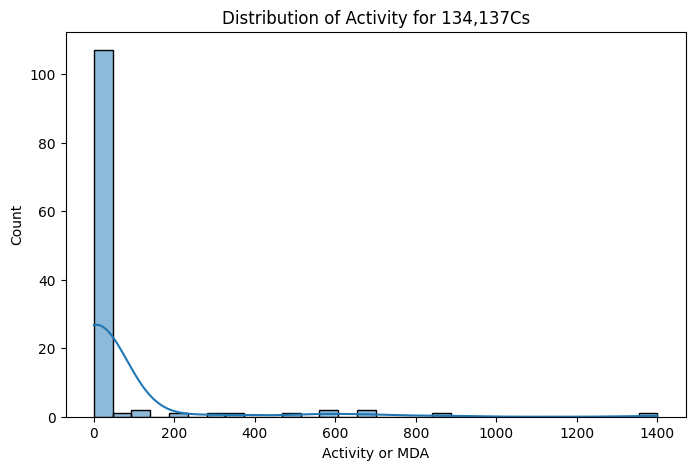

In [ ]:
for nuclide in top_n_nuclides:  # Loop through the top Nuclides you identified earlier
    plt.figure(figsize=(8, 5))
    sns.histplot(cleaned_data[cleaned_data['Nuclide'] == nuclide]['Activity or MDA'], bins=30, kde=True)
    plt.title(f"Distribution of Activity for {nuclide}")
    plt.show()


In [ ]:
summary_stats = cleaned_data.groupby('Nuclide')['Activity or MDA'].agg(['mean', 'median'])
print(summary_stats.sort_values(by='median', ascending=False).head(10))  # Top Nuclides by median
print(summary_stats.sort_values(by='mean', ascending=False).head(10))  # Top Nuclides by mean


                 mean       median
Nuclide                           
129I     1.757237e+09  178300000.0
236U     1.000123e+07    9500000.0
129Te    4.766667e+06    4000000.0
129mTe   1.300000e+06    1300000.0
135I     1.000000e+06    1000000.0
140Ba    1.363538e+06     870000.0
95Zr     2.300000e+05     230000.0
99Mo     2.100000e+05     210000.0
140La    5.200000e+05     210000.0
233U     9.109402e+04      87000.0
                 mean       median
Nuclide                           
129I     1.757237e+09  178300000.0
236U     1.000123e+07    9500000.0
129Te    4.766667e+06    4000000.0
140Ba    1.363538e+06     870000.0
129mTe   1.300000e+06    1300000.0
135I     1.000000e+06    1000000.0
140La    5.200000e+05     210000.0
136Cs    3.932496e+05      25500.0
105Ru    2.482500e+05      45000.0
95Zr     2.300000e+05     230000.0


<Figure size 1500x700 with 0 Axes>

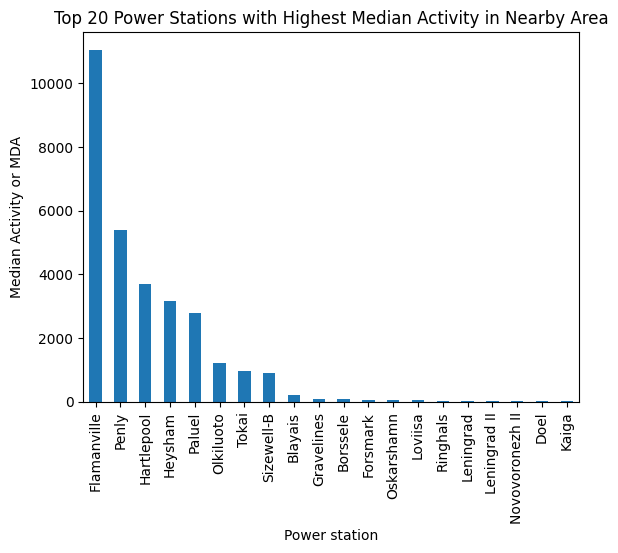

In [ ]:

from geopy.distance import geodesic

# Function to calculate distance between two points given their latitudes and longitudes
def calculate_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).km

# Define a radius (in km) within which you'll consider pollution data points for each power station
RADIUS = 50

medians_near_stations = []

for index, row in df.iterrows():
    station_lat, station_lon = row['Latitude (decimal)'], row['Longitude (decimal)']

    # Filter cleaned_data for samples within RADIUS km of the current power station
    mask = cleaned_data.apply(lambda x: calculate_distance(station_lat, station_lon, x['Latitude (decimal)'], x['Longitude (decimal)']) <= RADIUS, axis=1)

    median_activity = cleaned_data[mask]['Activity or MDA'].median()
    medians_near_stations.append(median_activity)

df['Median Activity'] = medians_near_stations

# Plotting the results
plt.figure(figsize=(15, 7))
df.sort_values(by='Median Activity', ascending=False).head(20).plot(x='Power station', y='Median Activity', kind='bar', legend=False)
plt.ylabel('Median Activity or MDA')
plt.title('Top 20 Power Stations with Highest Median Activity in Nearby Area')
plt.show()
